##### ARTI 560 - Computer Vision

## Instance Segmentation - Exercise

### Objective

In this exercise, you will implement **Instance Object Segmentation** using a pretrained **Mask R-CNN model** from TensorFlow Hub.

You will follow these steps:

1. **Load the pretrained Mask R-CNN model**  
   - Use this Kaggle link: [Mask R-CNN Inception-ResNet-v2](https://www.kaggle.com/models/tensorflow/mask-rcnn-inception-resnet-v2)  

2. **Select and load 5 different images**  
   - Choose **5 diverse images**, including:  
      - Crowded scenes with multiple objects  
      - Unusual angles, lighting conditions, or occlusions  
      - At least **one image containing multiple objects of the same class**

3. **Perform inference using the model**  
   - Feed images to the model to obtain predictions  

4. **Extract prediction outputs**  
   - **Bounding boxes** – coordinates of detected objects  
   - **Class labels** – names of detected objects  
   - **Segmentation masks** – pixel-wise masks for each object  

5. **Visualize the results**  
   - Overlay masks on detected objects  
   - Draw bounding boxes around objects  
   - Display class names and confidence scores  

6. **Experiment with confidence thresholds**  
   - Default threshold: **0.5**  
   - Lower threshold: **0.3** to detect more objects (may include false positives)  

---

- Keep in mind:  
  - Some objects may not be recognized at the default threshold
  - The model only detects objects from the **COCO dataset (80 classes)**  


In [4]:
!pip install tensorflow tensorflow_hub opencv-python matplotlib requests Pillow -q

In [2]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
import cv2
import matplotlib.pyplot as plt
import requests
import random
from io import BytesIO
from PIL import Image

In [3]:
# Load Model
print("Loading Mask R-CNN model...")
model = hub.load("https://www.kaggle.com/models/tensorflow/mask-rcnn-inception-resnet-v2/TensorFlow2/1024x1024/1")
print("Model loaded successfully!")

Loading Mask R-CNN model...
Model loaded successfully!


In [5]:
# Cell 4 — COCO Labels + Upload Images
COCO_CLASSES = {
    1: 'person', 2: 'bicycle', 3: 'car', 4: 'motorcycle', 5: 'airplane',
    6: 'bus', 7: 'train', 8: 'truck', 9: 'boat', 10: 'traffic light',
    11: 'fire hydrant', 13: 'stop sign', 14: 'parking meter', 15: 'bench',
    16: 'bird', 17: 'cat', 18: 'dog', 19: 'horse', 20: 'sheep', 21: 'cow',
    22: 'elephant', 23: 'bear', 24: 'zebra', 25: 'giraffe', 27: 'backpack',
    28: 'umbrella', 31: 'handbag', 32: 'tie', 33: 'suitcase', 34: 'frisbee',
    35: 'skis', 36: 'snowboard', 37: 'sports ball', 38: 'kite',
    39: 'baseball bat', 40: 'baseball glove', 41: 'skateboard',
    42: 'surfboard', 43: 'tennis racket', 44: 'bottle', 46: 'wine glass',
    47: 'cup', 48: 'fork', 49: 'knife', 50: 'spoon', 51: 'bowl',
    52: 'banana', 53: 'apple', 54: 'sandwich', 55: 'orange',
    56: 'broccoli', 57: 'carrot', 58: 'hot dog', 59: 'pizza', 60: 'donut',
    61: 'cake', 62: 'chair', 63: 'couch', 64: 'potted plant', 65: 'bed',
    67: 'dining table', 70: 'toilet', 72: 'tv', 73: 'laptop', 74: 'mouse',
    75: 'remote', 76: 'keyboard', 77: 'cell phone', 78: 'microwave',
    79: 'oven', 80: 'toaster', 81: 'sink', 82: 'refrigerator', 84: 'book',
    85: 'clock', 86: 'vase', 87: 'scissors', 88: 'teddy bear',
    89: 'hair drier', 90: 'toothbrush'
}

np.random.seed(42)
CLASS_COLORS = {cid: np.random.randint(50, 230, size=3).tolist()
                for cid in COCO_CLASSES}

# Upload images
from google.colab import files
import io

print("Upload 5 images:")
uploaded = files.upload()

images = []
image_sources = []
for filename, content in uploaded.items():
    img = Image.open(io.BytesIO(content)).convert("RGB")
    img = img.resize((1024, 1024), Image.LANCZOS)
    images.append(np.array(img))
    image_sources.append({"name": filename})
    print(f"{filename} → {np.array(img).shape}")

print(f"\nTotal: {len(images)}/5 images loaded")

Upload 5 images:


Saving donut.jpg to donut.jpg
Saving market.jpg to market.jpg
Saving animals.jpg to animals.jpg
Saving cars.jpg to cars.jpg
Saving birds.jpg to birds.jpg
donut.jpg → (1024, 1024, 3)
market.jpg → (1024, 1024, 3)
animals.jpg → (1024, 1024, 3)
cars.jpg → (1024, 1024, 3)
birds.jpg → (1024, 1024, 3)

Total: 5/5 images loaded


In [6]:
# Cell 5 — Inference & Extract Functions
def run_inference(image):
    tensor = tf.convert_to_tensor(image, dtype=tf.uint8)[tf.newaxis, ...]
    return model(tensor)

def extract_predictions(outputs):
    boxes   = outputs['detection_boxes'][0].numpy()
    classes = outputs['detection_classes'][0].numpy().astype(int)
    scores  = outputs['detection_scores'][0].numpy()
    masks   = outputs['detection_masks'][0].numpy()
    return boxes, classes, scores, masks

print("Running inference on all images...")
all_outputs = {}
for img, src in zip(images, image_sources):
    print(f"  Processing: {src['name']}")
    all_outputs[src['name']] = run_inference(img)
print("Inference complete!")

Running inference on all images...
  Processing: donut.jpg
  Processing: market.jpg
  Processing: animals.jpg
  Processing: cars.jpg
  Processing: birds.jpg
Inference complete!


=== Threshold: 0.5 ===



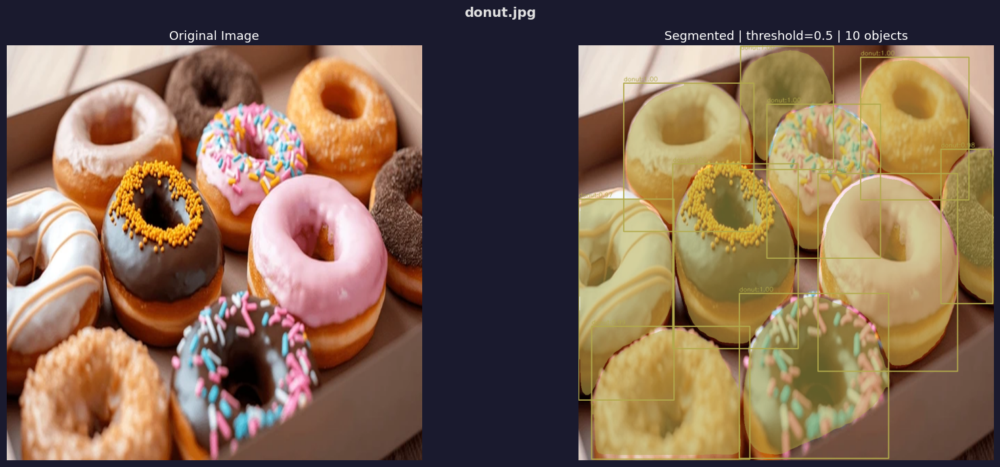

  → 10 object(s) detected



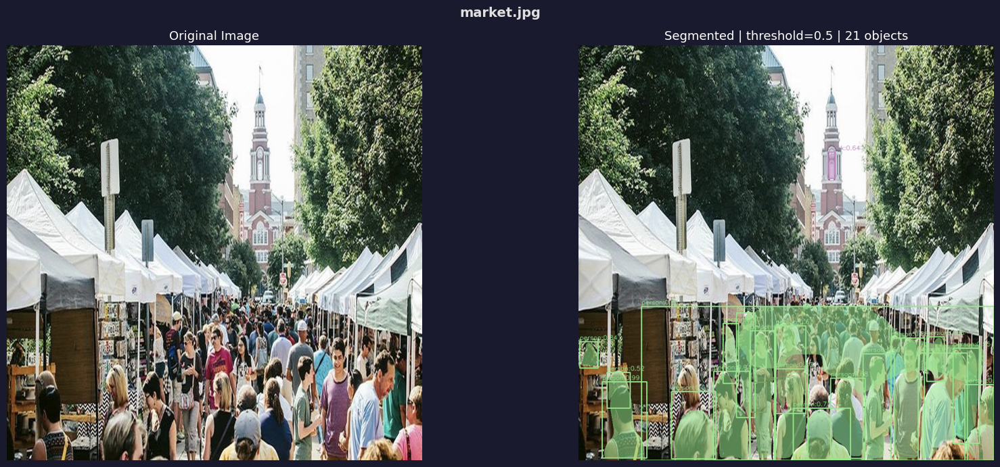

  → 21 object(s) detected



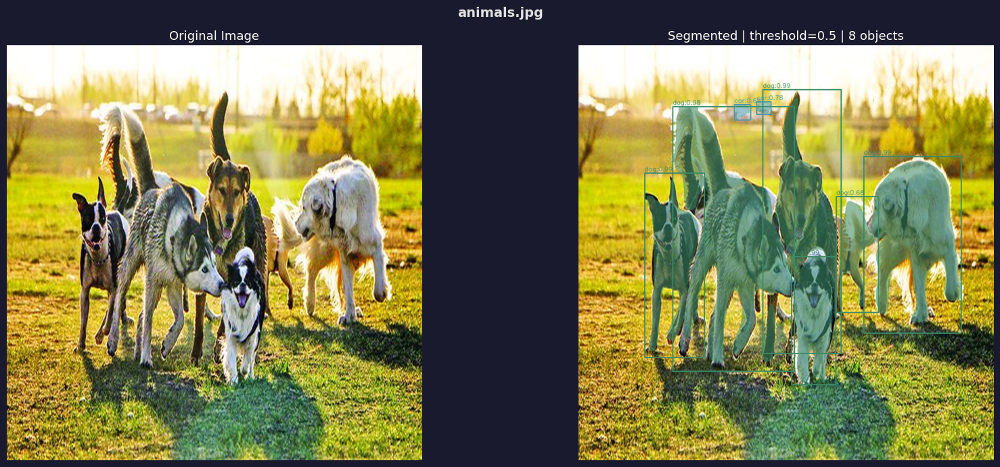

  → 8 object(s) detected



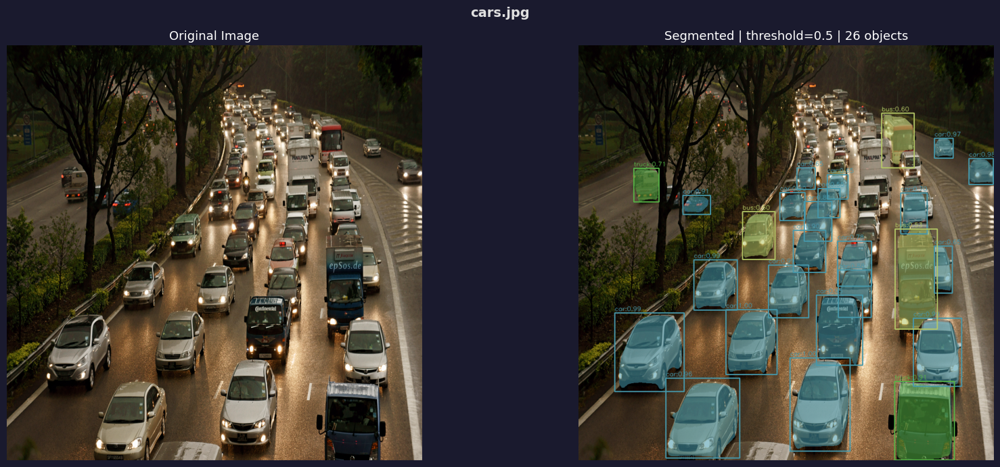

  → 26 object(s) detected



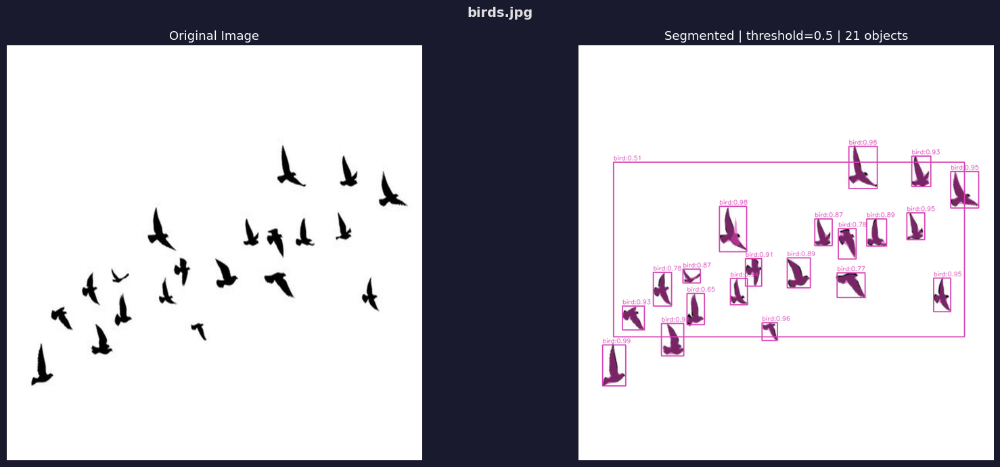

  → 21 object(s) detected



In [7]:
# Cell 6 — Visualize with Threshold 0.5
def visualize(image, boxes, classes, scores, masks, threshold=0.5, title=""):
    h, w   = image.shape[:2]
    output = image.copy().astype(np.float32)
    detected = [(boxes[i], classes[i], scores[i], masks[i])
                for i in range(len(scores)) if scores[i] >= threshold]

    for box, cls_id, score, mask in detected:
        color = CLASS_COLORS.get(int(cls_id), [255, 255, 255])
        y1,x1,y2,x2 = int(box[0]*h),int(box[1]*w),int(box[2]*h),int(box[3]*w)
        bh,bw = max(y2-y1,1), max(x2-x1,1)
        m   = cv2.resize(mask, (bw, bh)) > 0.5
        roi = output[y1:y2, x1:x2]
        cm  = np.zeros_like(roi); cm[m] = color
        output[y1:y2, x1:x2] = np.where(np.stack([m]*3,-1), roi*0.45+cm*0.55, roi)

    output = np.clip(output, 0, 255).astype(np.uint8)

    for box, cls_id, score, _ in detected:
        label = COCO_CLASSES.get(int(cls_id), f"Unknown_{cls_id}")
        color = CLASS_COLORS.get(int(cls_id), [255, 255, 255])
        y1,x1,y2,x2 = int(box[0]*h),int(box[1]*w),int(box[2]*h),int(box[3]*w)
        cv2.rectangle(output, (x1,y1), (x2,y2), color, 2)
        cv2.putText(output, f"{label}:{score:.2f}", (x1, max(y1-5,10)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1, cv2.LINE_AA)

    fig, axes = plt.subplots(1, 2, figsize=(18,7))
    fig.patch.set_facecolor('#1a1a2e')
    axes[0].imshow(image)
    axes[0].set_title("Original Image", color='white', fontsize=13)
    axes[0].axis("off")
    axes[1].imshow(output)
    axes[1].set_title(f"Segmented | threshold={threshold} | {len(detected)} objects",
                      color='white', fontsize=13)
    axes[1].axis("off")
    fig.suptitle(title, color='#e0e0e0', fontsize=14, fontweight='bold')
    plt.tight_layout(); plt.show()
    print(f"  → {len(detected)} object(s) detected\n")

# Run with threshold 0.5
print("=== Threshold: 0.5 ===\n")
for img, src in zip(images, image_sources):
    b, c, s, m = extract_predictions(all_outputs[src['name']])
    visualize(img, b, c, s, m, threshold=0.5, title=src['name'])

=== Threshold Experiment: 0.3 vs 0.5 ===

donut.jpg  →  0.3: 10 objects  |  0.5: 10 objects


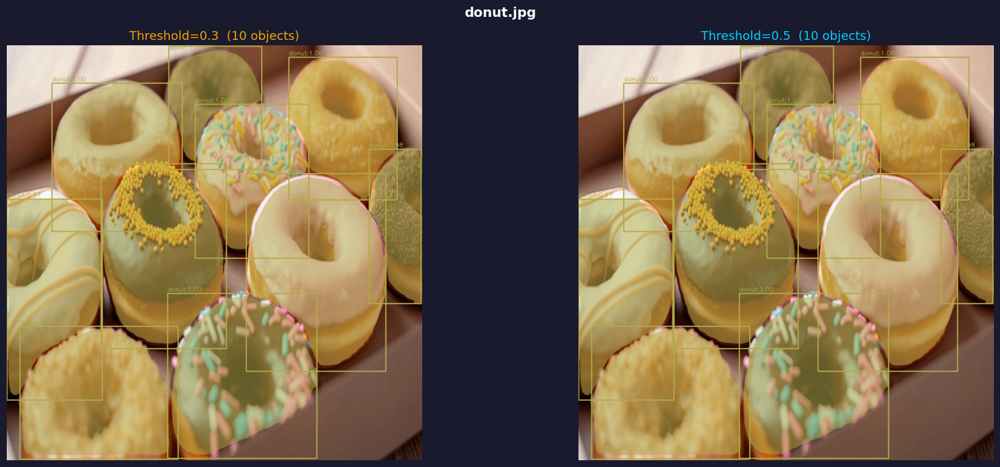

market.jpg  →  0.3: 27 objects  |  0.5: 21 objects


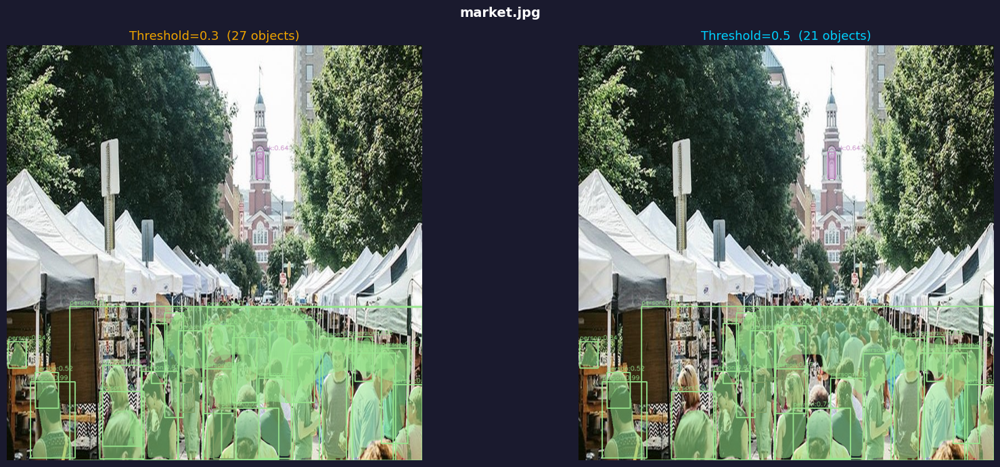

animals.jpg  →  0.3: 11 objects  |  0.5: 8 objects


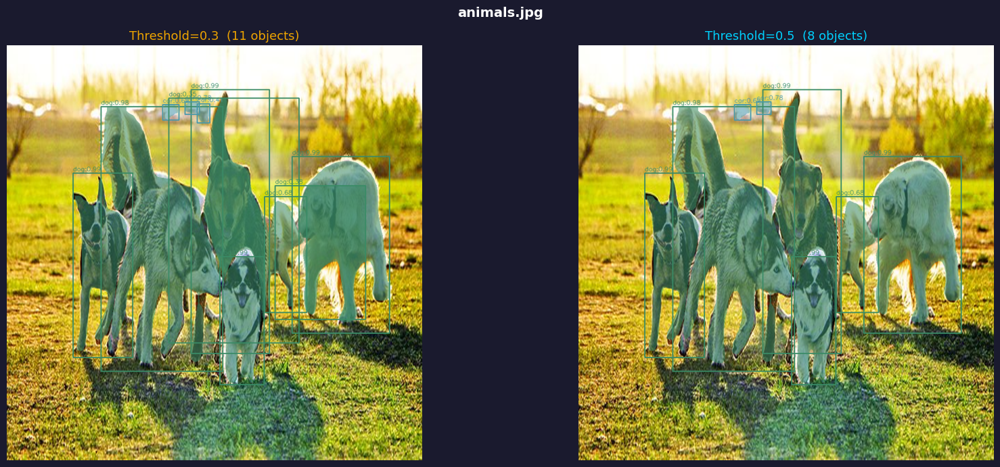

cars.jpg  →  0.3: 33 objects  |  0.5: 26 objects


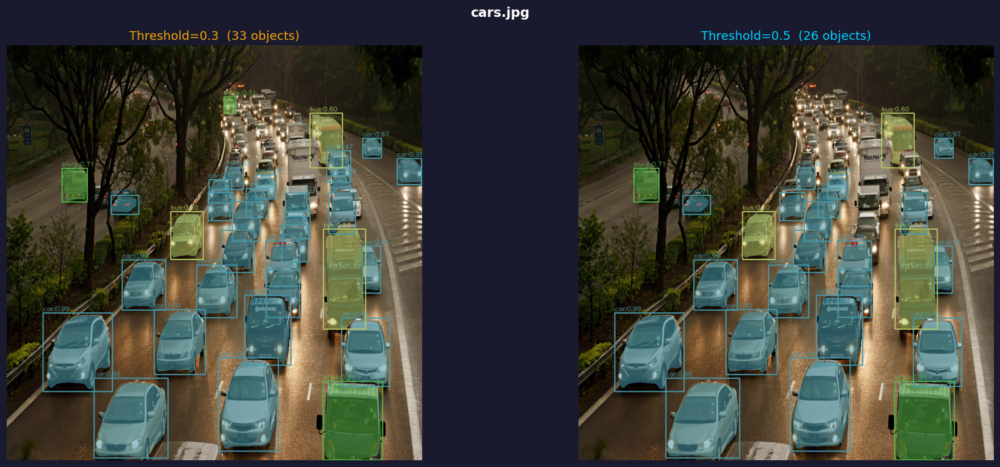

birds.jpg  →  0.3: 21 objects  |  0.5: 21 objects


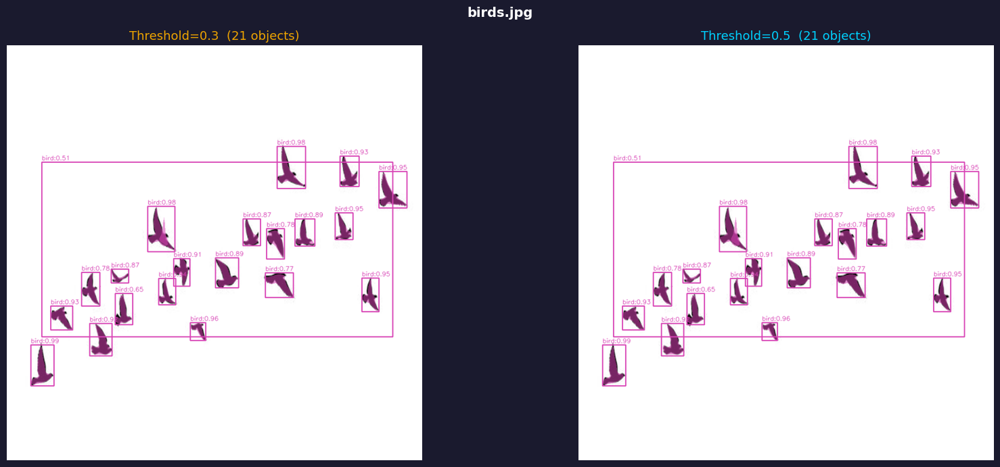

In [8]:
# Cell 7 — Threshold Experiment: 0.3 vs 0.5
def draw(image, boxes, classes, scores, masks, threshold):
    h, w   = image.shape[:2]
    output = image.copy().astype(np.float32)
    for i in range(len(scores)):
        if scores[i] < threshold: continue
        cls_id = int(classes[i])
        color  = CLASS_COLORS.get(cls_id, [255,255,255])
        y1,x1,y2,x2 = int(boxes[i][0]*h),int(boxes[i][1]*w),int(boxes[i][2]*h),int(boxes[i][3]*w)
        bh,bw = max(y2-y1,1), max(x2-x1,1)
        m   = cv2.resize(masks[i],(bw,bh)) > 0.5
        roi = output[y1:y2,x1:x2]; cm=np.zeros_like(roi); cm[m]=color
        output[y1:y2,x1:x2] = np.where(np.stack([m]*3,-1), roi*0.45+cm*0.55, roi)
    output = np.clip(output,0,255).astype(np.uint8)
    for i in range(len(scores)):
        if scores[i] < threshold: continue
        cls_id = int(classes[i])
        label  = COCO_CLASSES.get(cls_id, f"Unknown_{cls_id}")
        color  = CLASS_COLORS.get(cls_id, [255,255,255])
        y1,x1,y2,x2 = int(boxes[i][0]*h),int(boxes[i][1]*w),int(boxes[i][2]*h),int(boxes[i][3]*w)
        cv2.rectangle(output,(x1,y1),(x2,y2),color,2)
        cv2.putText(output,f"{label}:{scores[i]:.2f}",(x1,max(y1-5,10)),
                    cv2.FONT_HERSHEY_SIMPLEX,0.5,color,1,cv2.LINE_AA)
    return output

print("=== Threshold Experiment: 0.3 vs 0.5 ===\n")
for img, src in zip(images, image_sources):
    b, c, s, m = extract_predictions(all_outputs[src['name']])
    n3 = sum(1 for x in s if x >= 0.3)
    n5 = sum(1 for x in s if x >= 0.5)
    print(f"{src['name']}  →  0.3: {n3} objects  |  0.5: {n5} objects")

    fig, axes = plt.subplots(1, 2, figsize=(18,7))
    fig.patch.set_facecolor('#1a1a2e')
    axes[0].imshow(draw(img,b,c,s,m,0.3))
    axes[0].set_title(f"Threshold=0.3  ({n3} objects)", color='#f0a500', fontsize=13)
    axes[0].axis("off")
    axes[1].imshow(draw(img,b,c,s,m,0.5))
    axes[1].set_title(f"Threshold=0.5  ({n5} objects)", color='#00d2ff', fontsize=13)
    axes[1].axis("off")
    fig.suptitle(src['name'], color='white', fontsize=14, fontweight='bold')
    plt.tight_layout(); plt.show()